In [2]:
import itk
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import os
import torch
from torch.utils.data import Dataset, DataLoader

import pydicom as dicom
import cv2

In [4]:
path = "/Users/schama/Downloads/rsna-breast-cancer-detection/"

In [5]:
data = pd.read_csv(path+"train.csv")

# The csv file

This file will be essential in understanding the data. It has the image IDs as well as the patient's ID. All accompanying info seems to be here too, so I am not sure why we need the DICOM format if the metadata is here!

>**Columns (14):**  
>- **site_id**: hospital, there are two. `[1,2]`  
>- **patient_id**: identification for the patient that has many images assigned to it.   
>- **image_id**: there are many images to each patiente but each image number should be unique (i have not checked).   
>- **laterality**: left or right breast. `[L,R]`  
>- **view**: the orientation of the image. The default for a screening exam is to capture two views per breast, but there are 6 values. `['CC', 'MLO', 'ML', 'LM', 'AT', 'LMO']`  
>- **age**: age of patient, float. But there missing values we should worry about if we are going to use this information.  
>- **cancer**: if cancer was detected in that breast. `[0, 1]`  
>- **biopsy**: whether or not a follow-up biopsy was performed on the breast. **It is not provided for test examples, better not use this?.** `[0, 1]`  
>- **invasive**: if the breast is positive for cancer, whether or not the cancer proved to be invasive. **Only provided for train, better not use this?** `[0, 1]`  
>- **BIRADS**: 0 if the breast required follow-up, 1 if the breast was rated negative for cancer, 2 if the breast was rated as normal. **Also only provided for train, better not use this?** `[nan,  0.,  1.,  2.]`   
>- **implant**: it tells us if the patient has implants but does not specify the breast for site 1. It does for site 2. `[0, 1]`. 
>- **density**: a rating of how dense the breast tissue is. with A being the least dense and D being the most dense. Extremely dense tissue can make diagnosis more difficult. **Only provided for train!!! this is important, how to take this into account?** `[nan, 'C', 'D', 'B', 'A']`  
>- **machine_id**: the machine where the image was taken, there are 10 different ones and we need to worry about this in preprocessing. `[ 29,  21, 216,  93,  49,  48, 170, 210, 190, 197]`  
>- **difficult_negative_case**: true if the case was unusually difficult. **Only provided for train.** `[False,  True]`  

We have 54706 lines in the data frame, but there are 11913 patients in the train dataset.  

As for cancer and not cancer we have na imbalanced data set: 53548 not cancer, and 1158 cancer.

We need to make a column called `prediction_id` that has the `patient_id` with the `laterality` with an underscore to be able to submit our predictions in the end. So, there will have to be predictions for each patient's left and right breast (when there are both).

In [6]:
data.head()

,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case
0,2,10006,462822612,L,CC,61.0,0,0,0,NaN,0,NaN,29,False
1,2,10006,1459541791,L,MLO,61.0,0,0,0,NaN,0,NaN,29,False
2,2,10006,1864590858,R,MLO,61.0,0,0,0,NaN,0,NaN,29,False
3,2,10006,1874946579,R,CC,61.0,0,0,0,NaN,0,NaN,29,False
4,2,10011,220375232,L,CC,55.0,0,0,0,0.0,0,NaN,21,True


In [22]:
# ID code for the source hospital.
data.site_id.unique()
data.view.unique()
data.cancer.unique()
data.patient_id.unique().shape
data.difficult_negative_case.unique()
data.biopsy.unique()
data.BIRADS.unique()
data.invasive.unique()
data.implant.unique()
data.density.unique()

array([nan, 'C', 'D', 'B', 'A'], dtype=object)

In [17]:
pd.pivot_table(data, index = 'cancer', columns = 'site_id', values = 'patient_id' ,aggfunc ='count')

site_id,1,2
cancer,,
0,28855,24693
1,664,494


In [18]:
data.cancer.value_counts()

0    53548
1     1158
Name: cancer, dtype: int64

### Missing values

How to fill in missing value of age? Are we using it? Median?

Code - test has missing value in Fare - inputing median
medianFare = etest.Fare.median()
etest['Fare'] = etest.Fare.fillna(medianFare)


In [13]:
data.isna().sum()

site_id                        0
patient_id                     0
image_id                       0
laterality                     0
view                           0
age                           37
cancer                         0
biopsy                         0
invasive                       0
BIRADS                     28420
implant                        0
density                    25236
machine_id                     0
difficult_negative_case        0
dtype: int64

In [10]:
patient_ids = data.patient_id.unique()
patient_ids

array([10006, 10011, 10025, ...,   997,  9973,  9989])

In [8]:
# An ID code for the imaging device.
data.machine_id.unique()

array([ 29,  21, 216,  93,  49,  48, 170, 210, 190, 197])

In [9]:
data.shape

(54706, 14)

In [10]:
# Whether or not the breast was positive for malignant cancer. The target value. Only provided for train.
data.cancer.unique()

array([0, 1])

In [25]:
data.loc[data['cancer'] == 1]

,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case
87,1,10130,388811999,L,MLO,71.0,1,1,1,0.0,0,B,49,False
88,1,10130,613462606,L,CC,71.0,1,1,1,0.0,0,B,49,False
89,1,10130,1360338805,L,CC,71.0,1,1,1,0.0,0,B,49,False
90,1,10130,1672636630,L,MLO,71.0,1,1,1,0.0,0,B,49,False
190,1,10226,461614796,L,MLO,71.0,1,1,1,0.0,0,C,49,False
191,1,10226,530620473,L,CC,71.0,1,1,1,0.0,0,C,49,False
215,1,1025,773597682,L,CC,56.0,1,1,0,0.0,0,B,49,False
216,1,1025,1803952236,L,MLO,56.0,1,1,0,0.0,0,B,49,False
407,2,10432,458553546,L,CC,65.0,1,1,1,NaN,0,NaN,48,False
408,2,10432,1434858530,L,MLO,65.0,1,1,1,NaN,0,NaN,48,False


In [28]:
# making the new column
#df['baz'] = [str(x) + '_' + y for x, y in zip(df['bar'], df['foo'])]
#or
data['prediction_id'] = ['_'.join(i) for i in zip(data['patient_id'].map(str), data['laterality'])]
data.head()

,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case,prediction_id
0,2,10006,462822612,L,CC,61.0,0,0,0,NaN,0,NaN,29,False,10006_L
1,2,10006,1459541791,L,MLO,61.0,0,0,0,NaN,0,NaN,29,False,10006_L
2,2,10006,1864590858,R,MLO,61.0,0,0,0,NaN,0,NaN,29,False,10006_R
3,2,10006,1874946579,R,CC,61.0,0,0,0,NaN,0,NaN,29,False,10006_R
4,2,10011,220375232,L,CC,55.0,0,0,0,0.0,0,NaN,21,True,10011_L


In [ ]:
# saving to csv
data.to_csv('trainwithcolumn.csv', index=False)

# Making a CSV that has only the name of the image file and cancer label to try out first

In [7]:
df = data[['image_id', 'cancer']]
df

,image_id,cancer
0,462822612,0
1,1459541791,0
2,1864590858,0
3,1874946579,0
4,220375232,0
5,270344397,0
6,541722628,0
7,1031443799,0
8,562340703,0
9,1365269360,0


In [8]:
# saving to csv
df.to_csv('labels.csv', index=False)

In [43]:
# specify your image path
ds = dicom.dcmread(path+"train_images/1028/315268478.dcm")
ds2 = dicom.dcmread(path+"train_images/52056/885478248.dcm")
ds3 = dicom.dcmread(path+"train_images/10432/458553546.dcm")
from pydicom.data import get_testdata_file
file = path+"train_images/10226/348710745.dcm"
ds4 = dicom.dcmread(file)
ds5 = dicom.dcmread(path+"train_images/10130/1360338805.dcm")

In [56]:
ds5.file_meta.TransferSyntaxUID.name

'JPEG Lossless, Non-Hierarchical, First-Order Prediction (Process 14 [Selection Value 1])'

In [60]:
ds6 = dicom.dcmread(get_testdata_file('JPEG-LL.dcm'))


In [62]:
ds5

Dataset.file_meta -------------------------------
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Digital X-Ray Image Storage - For Presentation
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.840.10009.1.2.3.10130.1.1360338805
(0002, 0010) Transfer Syntax UID                 UI: JPEG Lossless, Non-Hierarchical, First-Order Prediction (Process 14 [Selection Value 1])
(0002, 0012) Implementation Class UID            UI: 1.2.840.113654.2.3.1995.2.12.0
(0002, 0013) Implementation Version Name         SH: 'PYDICOM 2.3.0'
-------------------------------------------------
(0008, 0018) SOP Instance UID                    UI: 1.2.840.10009.1.2.3.10130.1.1360338805
(0008, 0023) Content Date                        DA: '20221118'
(0008, 0033) Content Time                        TM: '183942.847932'
(0010, 0020) Patient ID                          LO: '10130'
(0018, 11a0) Body Part Thickness                 DS: '82.0'
(0

In [57]:
#jpg_arr = ds6.pixel_array

In [58]:
ds = dicom.dcmread(get_testdata_file('JPEG2000.dcm'))
j2k_arr = ds.pixel_array

# It seems that for the site 2 we will have to see how to read the data!
Not only site 2 I guess!


In [ ]:
#conda install -c conda-forge gdcm ---> done
#pip install pylibjpeg pylibjpeg-libjpeg pydicom --> not even with this the dicom 4 was read!!
#pip install pylibjpeg --> done but did not work I will try the one before
#https://github.com/pydicom/pylibjpeg

In [65]:


pixel_array_numpy = ds3.pixel_array


In [66]:
pixel_array_numpy.shape

(4096, 3328)

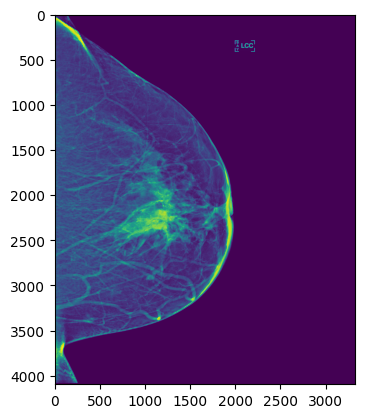

In [25]:
imgplot = plt.imshow(pixel_array_numpy)

In [35]:
meta = dicom.read_file(path+"train_images/1028/315268478.dcm")

In [36]:
meta

Dataset.file_meta -------------------------------
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Digital X-Ray Image Storage - For Presentation
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.840.10009.1.2.3.1028.1.315268478
(0002, 0010) Transfer Syntax UID                 UI: JPEG 2000 Image Compression (Lossless Only)
(0002, 0012) Implementation Class UID            UI: 1.2.840.113654.2.3.1995.2.12.0
(0002, 0013) Implementation Version Name         SH: 'PYDICOM 2.3.0'
-------------------------------------------------
(0008, 0018) SOP Instance UID                    UI: 1.2.840.10009.1.2.3.1028.1.315268478
(0008, 0023) Content Date                        DA: '20221118'
(0008, 0033) Content Time                        TM: '184049.243873'
(0010, 0020) Patient ID                          LO: '1028'
(0020, 000d) Study Instance UID                  UI: 1.2.840.10009.1.2.3.1028
(0020, 000e) Series Instance UID  

In [ ]:
image_format = '.jpg' # or '.png'
image_path = image_path.replace('.dcm', image_format)
cv2.imwrite(image_path, pixel_array_numpy)

# Playing with pytorch

In [26]:
class DICOMDataset(Dataset):
    def __init__(self, dicom_dir, csv_file):
        self.dicom_dir = dicom_dir
        self.metadata = pd.read_csv(csv_file)

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        # Load DICOM image
        file_name = str(self.metadata.iloc[idx]['image_id'])+'.dcm'
        file_path = os.path.join(self.dicom_dir, file_name)
        image_data = dicom.dcmread(file_path).pixel_array
        image_data = np.expand_dims(image_data, axis=0)
        image_tensor = torch.from_numpy(image_data).float()
        

        # Load metadata
        label = self.metadata.iloc[idx]['cancer']
        metadata_tensor = torch.tensor([label], dtype=torch.float32)

        return image_tensor, metadata_tensor

In [27]:
dataset = DICOMDataset('./train_test/', './labels_test.csv')
dataloader = DataLoader(dataset, batch_size=5)

In [28]:
for batch in dataloader:
    x, y = batch
    plot_batch(x, y)
    print('Batch size:', x.size())
    break

RuntimeError: The following handlers are available to decode the pixel data however they are missing required dependencies: GDCM (req. ), pylibjpeg (req. )